# Processamento de Imagens
Este notebook visa demonstrar de forma concisa e prática a importância dos métodos de processamento de imagens no processo de desenvolvimento de modelos de machine learning.

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import skimage
from skimage.feature import peak_local_max
from scipy import ndimage as ndi
import matplotlib.pyplot as plt

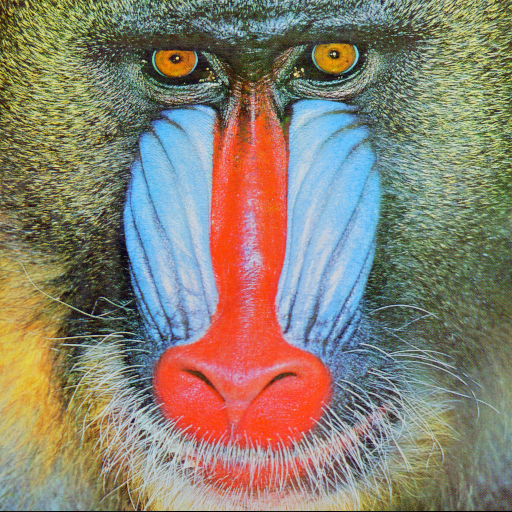

In [ ]:
img = cv2.imread("/content/sample_data/baboon.png")
cv2_imshow(img)

## Aplicando Kernels com OpenCV
Além de efeitos para o Instagram, é sempre importante lembrarmos que, de forma prática, o que se faz quando aplicamos efeitos à uma imagem é transformar uma matriz de valores.

Valores de cor para pixels são controlados utilizando os canais RGB com valores entre 0 e 255 para cada um destes. Imagens em tons de cinza possuem apenas um canal que define o brilho do píxel. Isso faz toda a diferença em como processamos esses dados dentro de nosso programas.

Uma imagem colorida comumente apresentará uma estrutura semelhante a 512x512x3 enquanto uma imagem em escalas de cinza despensa a última dimensão.

Os kernels são aplicados às imagens através do processo de convolução ilustrado na imagem abaixo.

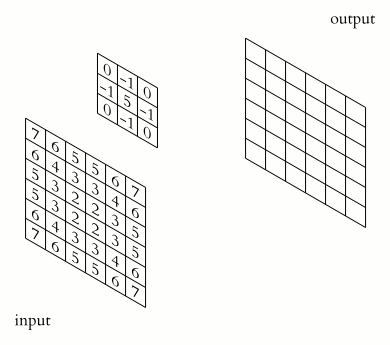

By <a href="//commons.wikimedia.org/w/index.php?title=User:Plotke&amp;action=edit&amp;redlink=1" class="new" title="User:Plotke (page does not exist)">Michael Plotke</a> - <span class="int-own-work" lang="en">Own work</span>, <a href="https://creativecommons.org/licenses/by-sa/3.0" title="Creative Commons Attribution-Share Alike 3.0">CC BY-SA 3.0</a>, <a href="https://commons.wikimedia.org/w/index.php?curid=24288958">Link</a>

Aqui definimos kernels em formato de arrays do NumPy e depois aplicamos o processo convolucional descrito acima através da função `cv2.filter2D()` da biblioteca OpenCV.

In [ ]:
edge = np.array([[-1, -1, -1],
                 [-1,  8, -1],
                 [-1, -1, -1]])

contrast = np.array([[0, -1, 0],
                     [-1,  8, -1],
                     [-1, -1, -1]])

sharpen = np.array([[0, -1, 0],
                   [-1,  5, -1],
                   [0, -1, 0]])

smooth = np.array([[1/9, 1/9, 1/9],
                   [1/9, 1/9, 1/9],
                   [1/9, 1/9, 1/9]])

result_edge = cv2.filter2D(img, -1, edge)
result_contrast = cv2.filter2D(img, -1, contrast)
result_sharpen = cv2.filter2D(img, -1, sharpen)
result_smooth = cv2.filter2D(img, -1, smooth)

cv2.imwrite("result_edge.png", result_edge)
cv2.imwrite("result_contrast.png", result_contrast)
cv2.imwrite("result_sharpen.png", result_sharpen)
cv2.imwrite("result_smooth.png", result_smooth)

True

## Como isso tudo se relaciona à redes neurais?
Os usos para processamento de imagens no treinamento de redes neurais são os mais diversos. Em geral, o pré-processamento dos dados visa auxiliar os modelos a convergirem mais eficientemente destacando as característica mais importantes nos dados.

### Pré-processamento
- **Edge detection**: Ajuda a colocar em evidência características estruturais contidas nas imagens, auxiliando nossas redes a focar em contornos e formas ao invés píxeis crús.
- **Sharpening e contraste**: Em geral fazem com que detalhes na imagem possuam valores mais significativos transformando tons esmaecidos em píxeis mais fortemente acesos, ou seja, valores mais representativos dentro de nossa matriz.
- **Blurring**: Reduz o ruído na imagem prevenindo que as redes aprendam padrões irrelevantes assim melhorando a generalização do modelo.

### Data Augmentation
Aplicar transformações em imagens para aumentar a variedade dos datasets de treinamento é uma técnica amplamente usada e consiste em gerar entradas levemente diferentes a partir dos dados originais como imagens rotacionadas à 90, 180 graus, adicionar um pouco de blur, contraste e outros efeitos para forçar a rede a generalizar ainda mais.

### Redes Neurais Convolucionais (CNNs)
De forma geral, o que as redes convolucionais fazem em suas primeiras camadas pode ser diretamente comparado com o que vemos aqui. As CNNs aprendem que tipo de kernel oferece os melhores resultados para extração de features em suas imagens de treino.

### Transfer Learning
Em diversas aplicações de visão computacional, redes neurais pré-treinadas como ResNet e VGG são utilizadas. Essas redes já aprenderam a extrair features complexas de imagens superando e muito o que podemos fazer com os kernels mais simples como os demonstrados aqui, contudo a essência dos kernels gerados por essas redes ainda é a mesma.

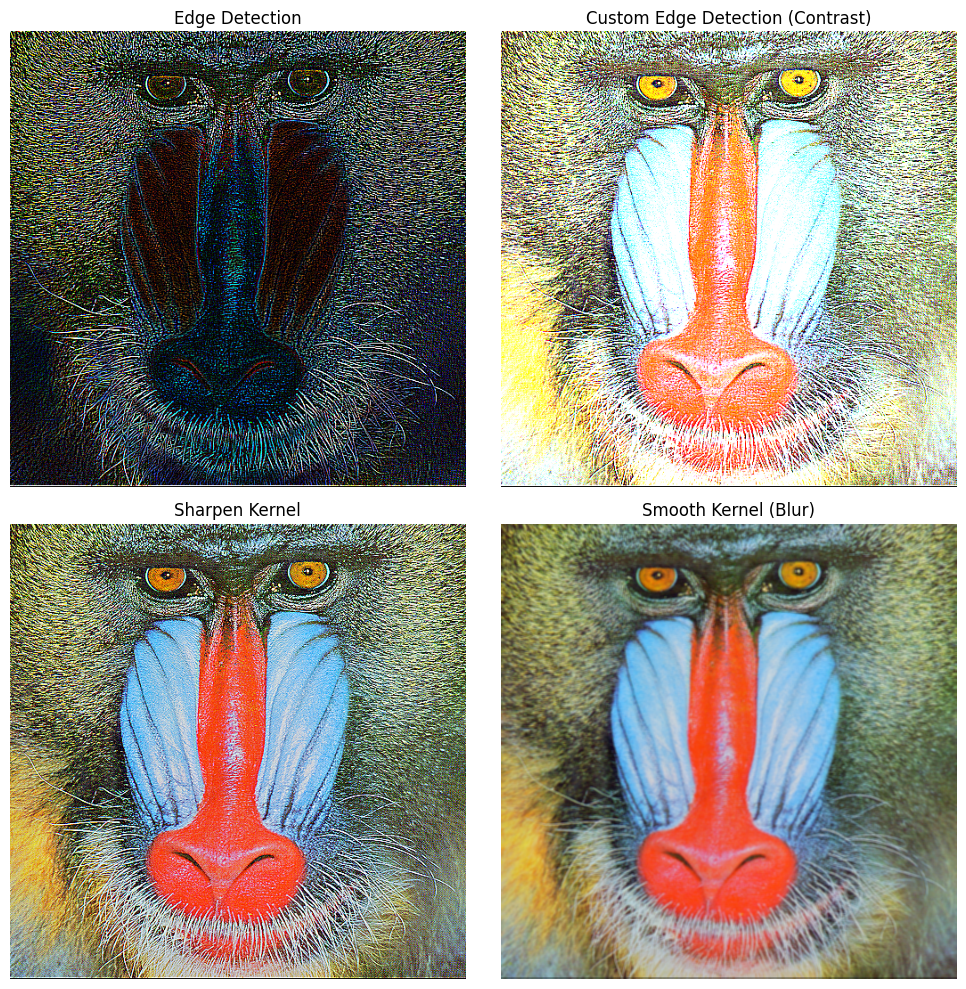

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs[0, 0].imshow(cv2.cvtColor(result_edge, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title('Edge Detection')
axs[0, 0].axis('off')

axs[0, 1].imshow(cv2.cvtColor(result_contrast, cv2.COLOR_BGR2RGB))
axs[0, 1].set_title('Custom Edge Detection (Contrast)')
axs[0, 1].axis('off')

axs[1, 0].imshow(cv2.cvtColor(result_sharpen, cv2.COLOR_BGR2RGB))
axs[1, 0].set_title('Sharpen Kernel')
axs[1, 0].axis('off')

axs[1, 1].imshow(cv2.cvtColor(result_smooth, cv2.COLOR_BGR2RGB))
axs[1, 1].set_title('Smooth Kernel (Blur)')
axs[1, 1].axis('off')

plt.tight_layout()
plt.show()

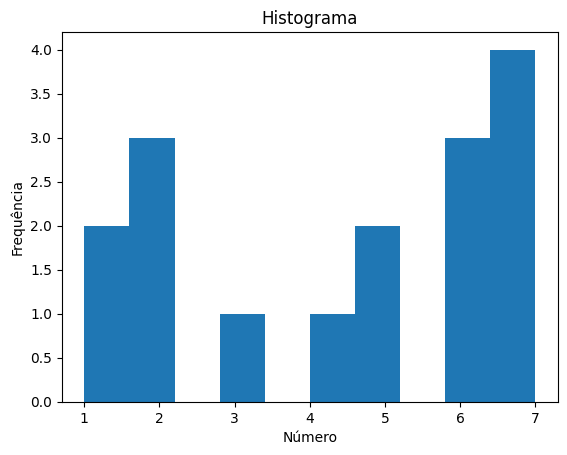

In [ ]:
hist = np.array([1, 1, 2, 2, 2, 3, 4, 5, 5, 6, 6, 6, 7, 7, 7, 7])
plt.title("Histograma")
plt.ylabel("Frequência")
plt.xlabel("Número")
plt.hist(hist)
plt.show()

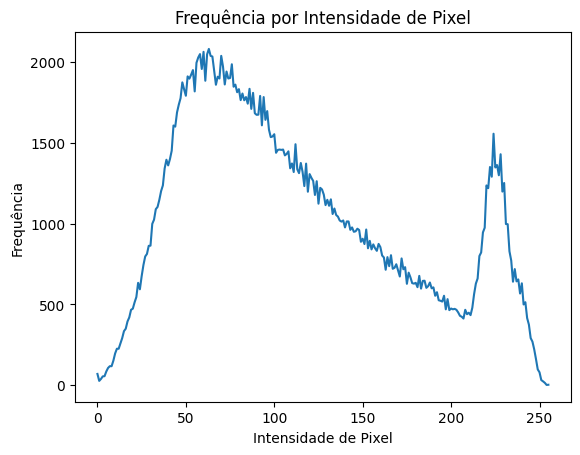

In [ ]:
img_hist = cv2.calcHist([img], [0], None, [256], [0, 256])
plt.title("Frequência por Intensidade de Pixel")
plt.ylabel("Frequência")
plt.xlabel("Intensidade de Pixel")
plt.plot(img_hist)
plt.show()

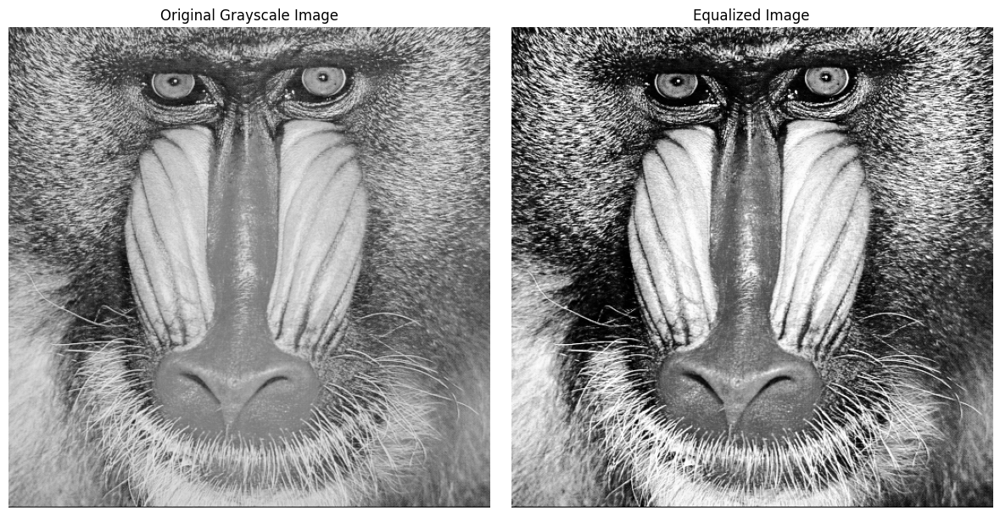

In [ ]:
original = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
equalized = cv2.equalizeHist(original)
cv2.imwrite('resultEqHistU3A5.png', equalized)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(original, cmap='gray')
axs[0].set_title('Original Grayscale Image')
axs[0].axis('off')

axs[1].imshow(equalized, cmap='gray')
axs[1].set_title('Equalized Image')
axs[1].axis('off')

plt.tight_layout()
plt.show()

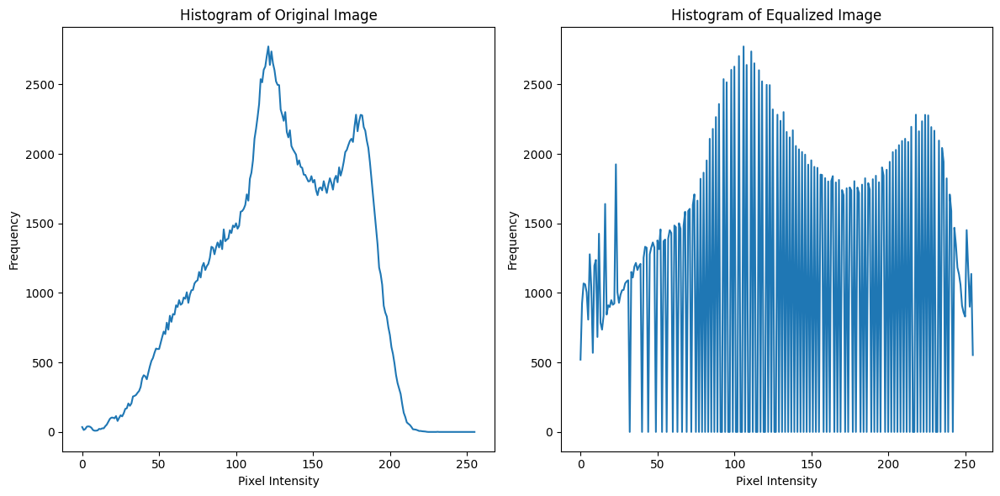

In [ ]:
hist_original = cv2.calcHist([original], [0], None, [256], [0, 256])
hist_equalized = cv2.calcHist([equalized], [0], None, [256], [0, 256])

fig, axs_hist = plt.subplots(1, 2, figsize=(12, 6))

axs_hist[0].plot(hist_original)
axs_hist[0].set_title('Histogram of Original Image')
axs_hist[0].set_xlabel('Pixel Intensity')
axs_hist[0].set_ylabel('Frequency')

axs_hist[1].plot(hist_equalized)
axs_hist[1].set_title('Histogram of Equalized Image')
axs_hist[1].set_xlabel('Pixel Intensity')
axs_hist[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

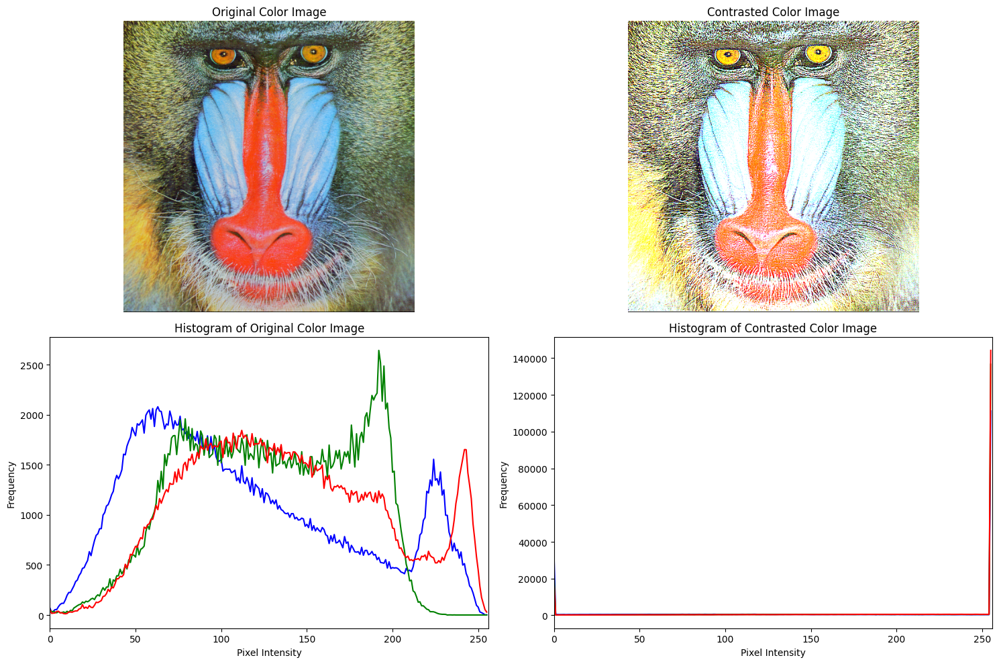

In [ ]:
fig, axs_hist_color = plt.subplots(2, 2, figsize=(15, 10))

# Display Original Color Image
axs_hist_color[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs_hist_color[0, 0].set_title('Original Color Image')
axs_hist_color[0, 0].axis('off')

# Display Contrasted Color Image (r2)
axs_hist_color[0, 1].imshow(cv2.cvtColor(result_contrast, cv2.COLOR_BGR2RGB))
axs_hist_color[0, 1].set_title('Contrasted Color Image')
axs_hist_color[0, 1].axis('off')

colors = ('b', 'g', 'r')
for i, col in enumerate(colors):
    hist = cv2.calcHist([img], [i], None, [256], [0, 256])
    axs_hist_color[1, 0].plot(hist, color=col)
    axs_hist_color[1, 0].set_xlim([0, 256])
axs_hist_color[1, 0].set_title('Histogram of Original Color Image')
axs_hist_color[1, 0].set_xlabel('Pixel Intensity')
axs_hist_color[1, 0].set_ylabel('Frequency')

for i, col in enumerate(colors):
    hist = cv2.calcHist([result_contrast], [i], None, [256], [0, 256])
    axs_hist_color[1, 1].plot(hist, color=col)
    axs_hist_color[1, 1].set_xlim([0, 256])
axs_hist_color[1, 1].set_title('Histogram of Contrasted Color Image')
axs_hist_color[1, 1].set_xlabel('Pixel Intensity')
axs_hist_color[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

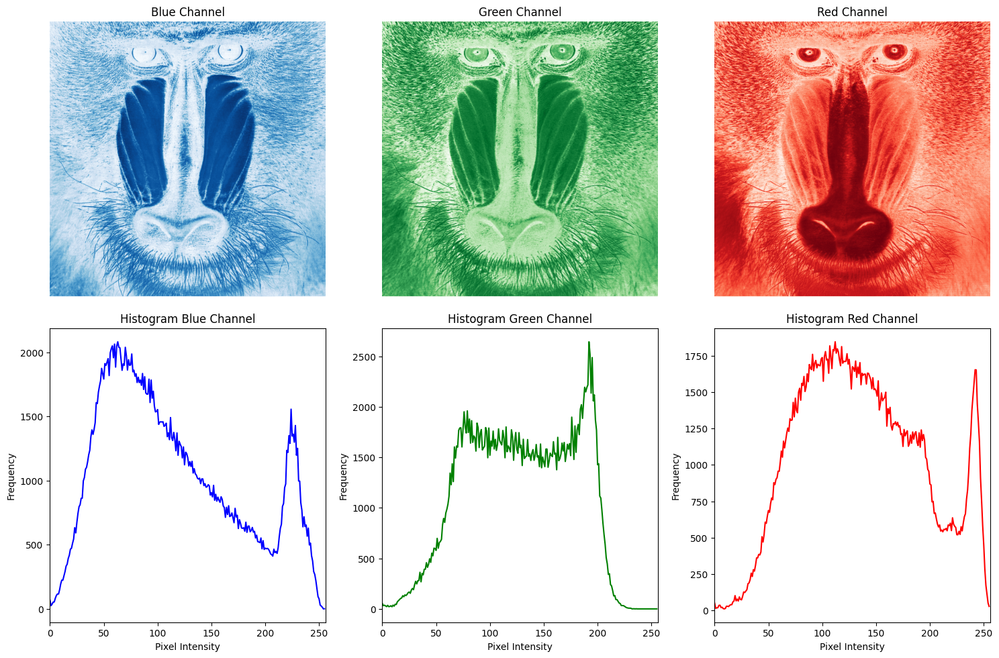

In [ ]:
b, g, r = cv2.split(img)

# Calculate histograms for each channel
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Display B, G, R channels with their respective color maps
axs[0, 0].imshow(b, cmap='Blues')
axs[0, 0].set_title('Blue Channel')
axs[0, 0].axis('off')

axs[0, 1].imshow(g, cmap='Greens')
axs[0, 1].set_title('Green Channel')
axs[0, 1].axis('off')

axs[0, 2].imshow(r, cmap='Reds')
axs[0, 2].set_title('Red Channel')
axs[0, 2].axis('off')

# Display histograms for B, G, R channels
axs[1, 0].plot(hist_b, color='blue')
axs[1, 0].set_title('Histogram Blue Channel')
axs[1, 0].set_xlabel('Pixel Intensity')
axs[1, 0].set_ylabel('Frequency')
axs[1, 0].set_xlim([0, 256])

axs[1, 1].plot(hist_g, color='green')
axs[1, 1].set_title('Histogram Green Channel')
axs[1, 1].set_xlabel('Pixel Intensity')
axs[1, 1].set_ylabel('Frequency')
axs[1, 1].set_xlim([0, 256])

axs[1, 2].plot(hist_r, color='red')
axs[1, 2].set_title('Histogram Red Channel')
axs[1, 2].set_xlabel('Pixel Intensity')
axs[1, 2].set_ylabel('Frequency')
axs[1, 2].set_xlim([0, 256])

plt.tight_layout()
plt.show()

## Segmentação de Imagens

A segmentação de imagens é o processo de dividir uma imagem digital em múltiplos segmentos de imagem (conjuntos de pixels). O objetivo é simplificar e/ou mudar a representação de uma imagem para algo mais significativo e fácil de analisar. Isso pode ser usado para localizar objetos e limites (linhas, curvas, etc.) em imagens.

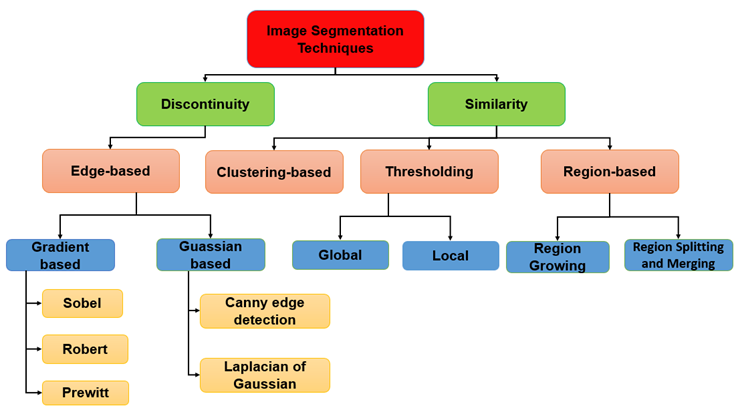

Fonte: https://pooja-bagad18.medium.com/classification-of-image-segmentation-techniques-cc6a031b75fc

### Limiarização (Thresholding)

Um dos métodos mais simples de segmentação é a limiarização, onde pixels com intensidade acima de um certo valor são classificados de uma forma, e pixels abaixo são classificados de outra. Isso é particularmente útil para separar objetos do fundo em imagens em escala de cinza.

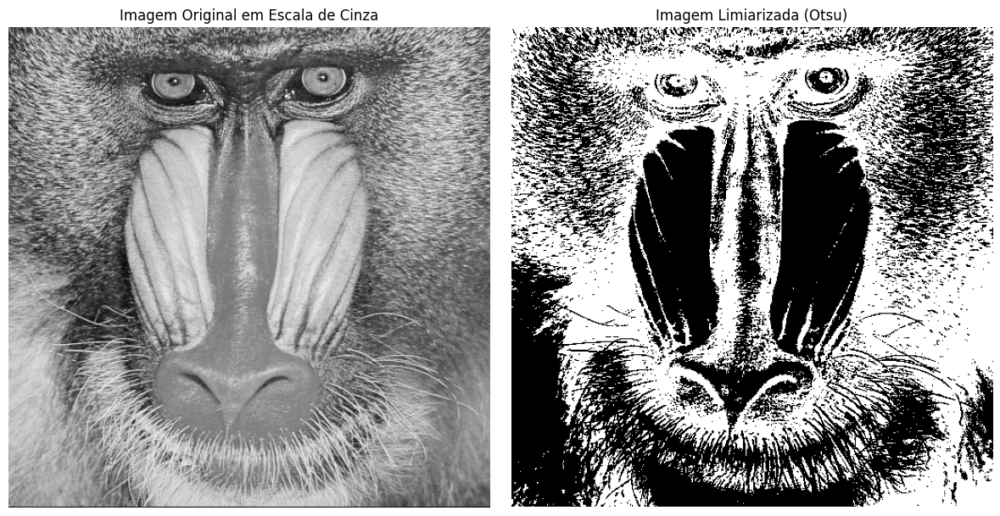

In [ ]:
# Converter a imagem original para escala de cinza, se ainda não estiver
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Aplicar limiarização binária (Otsu's Binarization)
# Retorna o limiar e a imagem limiarizada
# cv2.THRESH_BINARY_INV inverte o resultado (objetos pretos no fundo branco)
ret, thresh = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(img_gray, cmap='gray')
axs[0].set_title('Imagem Original em Escala de Cinza')
axs[0].axis('off')

axs[1].imshow(thresh, cmap='gray')
axs[1].set_title('Imagem Limiarizada (Otsu)')
axs[1].axis('off')

plt.tight_layout()
plt.show()

### Detecção de Contornos

Após a limiarização, muitas vezes queremos identificar e destacar as bordas ou contornos dos objetos segmentados. Isso pode ser feito com a função `cv2.findContours`.

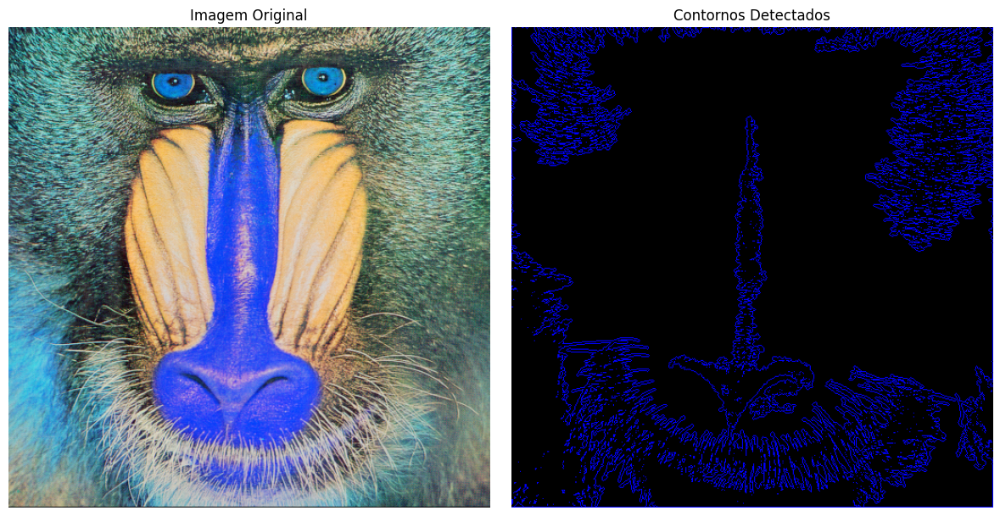

In [ ]:
# cv2.RETR_EXTERNAL recupera apenas os contornos externos
# cv2.CHAIN_APPROX_SIMPLE compacta pontos de contorno redundantes
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Criar uma imagem em branco para desenhar os contornos
contours_img = np.zeros_like(img)

# Desenhar os contornos na imagem em branco
# -1 para desenhar todos os contornos, (0, 0, 255) para cor azul, 1 para espessura
cv2.drawContours(contours_img, contours, -1, (0, 0, 255), 1)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(img, cmap='gray')
axs[0].set_title('Imagem Original')
axs[0].axis('off')

axs[1].imshow(contours_img, cmap='gray')
axs[1].set_title('Contornos Detectados')
axs[1].axis('off')

plt.tight_layout()
plt.show()

## Algoritmo Watershed

O algoritmo Watershed é uma ferramenta poderosa para segmentação de imagens, especialmente útil para separar objetos que estão conectados ou sobrepostos. Ele funciona como uma metáfora de bacias hidrográficas, onde a imagem é vista como uma superfície topográfica: os pixels de alta intensidade são 'picos' e os de baixa intensidade são 'vales'. O algoritmo 'inunda' esses vales a partir de pontos de sementes (marcadores), construindo 'barragens' (linhas de watershed) onde as diferentes bacias se encontram, efetivamente segmentando os objetos.

Para usar o Watershed, geralmente precisamos de:
1.  **Imagem em escala de cinza**: Para calcular o gradiente.
2.  **Limiarização**: Para obter um mapa binário.
3.  **Transformada de Distância**: Para encontrar o 'esqueleto' dos objetos e preparar para os marcadores.
4.  **Marcadores de fundo e primeiro plano**: Pontos que identificam inequivocamente o fundo e o interior dos objetos.

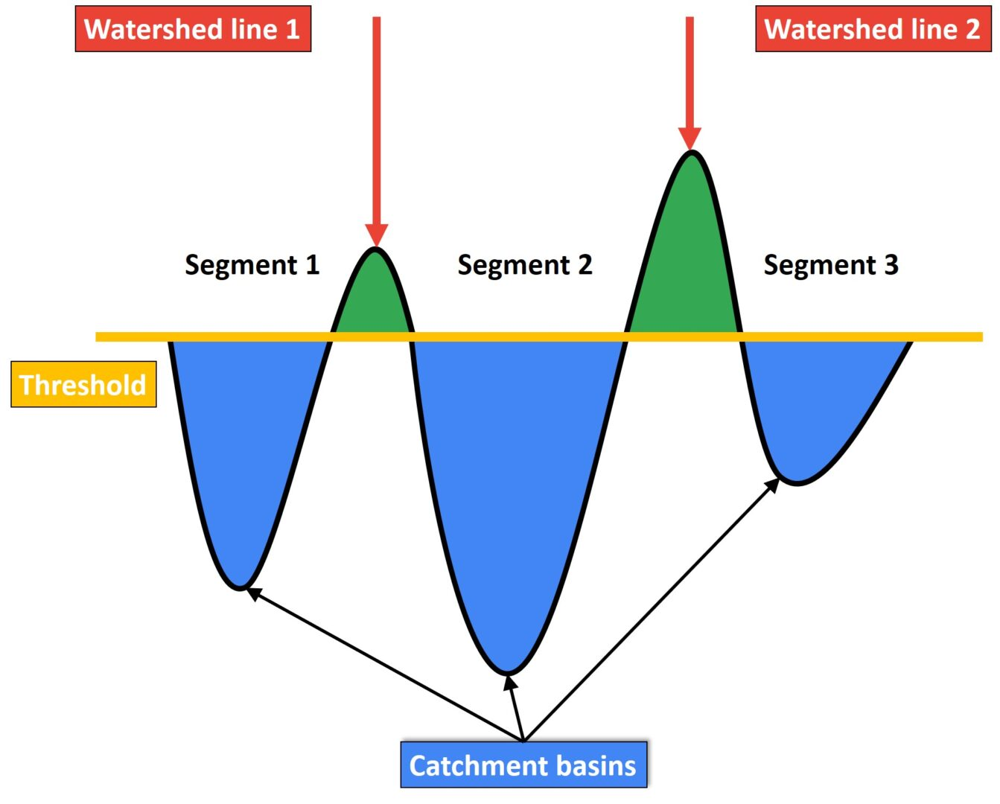

Fonte: https://datahacker.rs/007-opencv-projects-image-segmentation-with-watershed-algorithm/

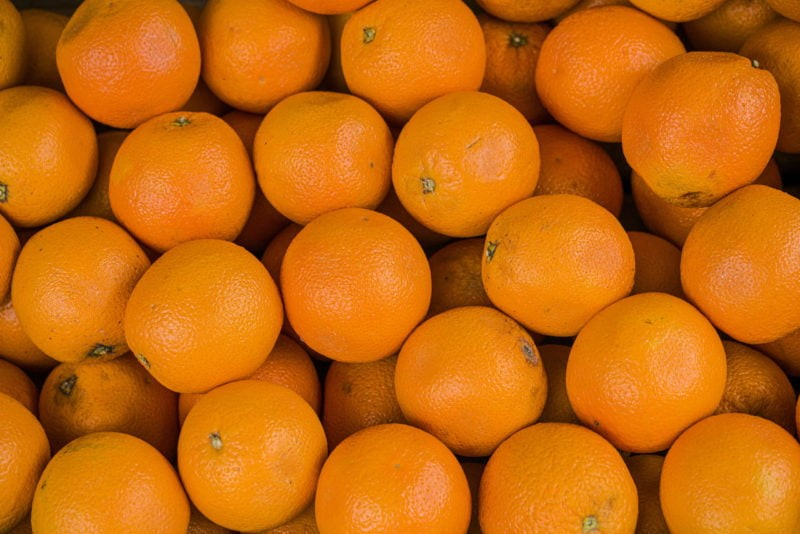

In [ ]:
img_oranges = cv2.imread('/content/sample_data/oranges.png')
cv2_imshow(img_oranges)

### Convertendo para Escala de Cinza e Limiarização

Primeiro, a imagem colorida de laranjas é convertida para escala de cinza para simplificar o processamento. Em seguida, uma limiarização binária (`cv2.threshold`) é aplicada. Pixels com intensidade acima de um determinado valor (neste caso, `120`) são definidos como brancos (255), e os abaixo são definidos como pretos (0). Isso ajuda a separar as laranjas do fundo.

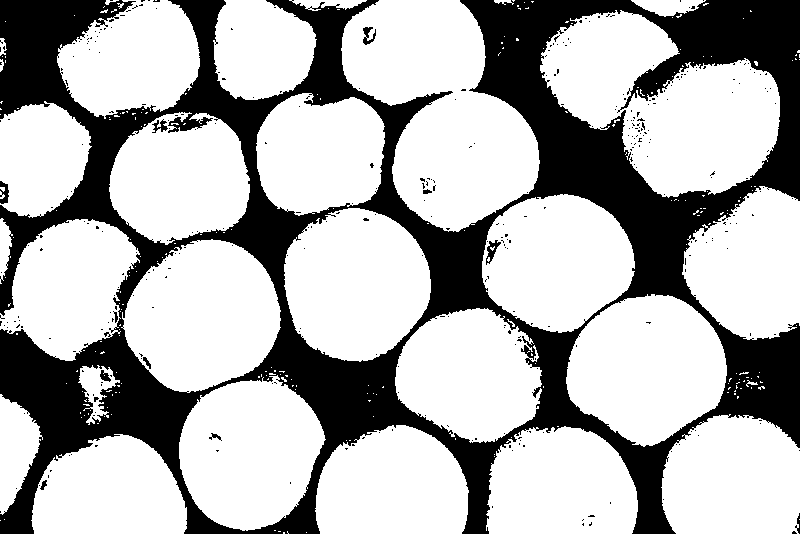

In [ ]:
gray = cv2.cvtColor(img_oranges, cv2.COLOR_BGR2GRAY)
ret, thresh_img_oranges = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh_img_oranges)

### Operação de Abertura Morfológica (`cv2.morphologyEx` com `MORPH_OPEN`)

Para remover pequenos ruídos e suavizar as bordas dos objetos, aplicamos uma operação morfológica de "abertura". Esta operação consiste em uma erosão seguida por uma dilatação. Ela é útil para separar objetos conectados por pequenas pontes de pixel e para remover pequenos pontos brancos (ruído) no fundo ou buracos nos objetos.

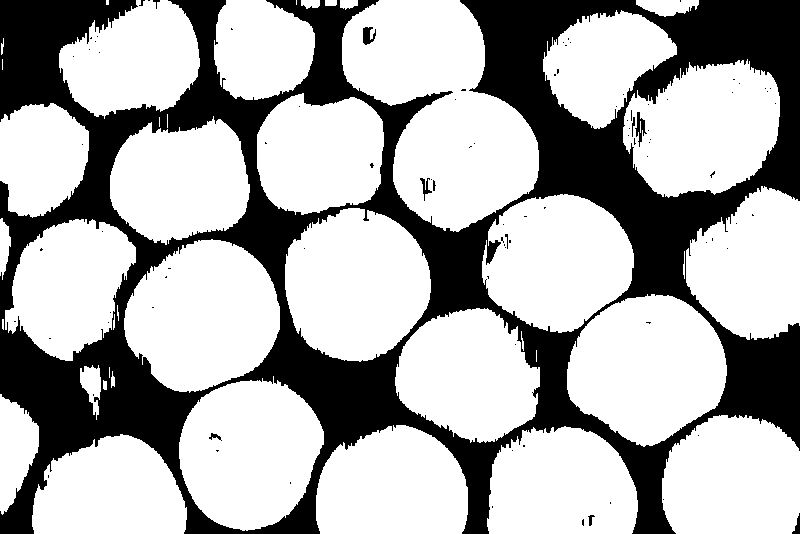

In [ ]:
kernel = np.ones((3),np.uint8)
opening_img_oranges = cv2.morphologyEx(thresh_img_oranges, cv2.MORPH_OPEN, kernel, iterations = 4)

cv2_imshow(opening_img_oranges)

### Operação de Fechamento Morfológica (`cv2.morphologyEx` com `MORPH_CLOSE`)

Similar à abertura, a operação de "fechamento" consiste em uma dilatação seguida por uma erosão. Ela é usada para fechar pequenos buracos dentro dos objetos ou pequenas rachaduras em suas bordas, e para conectar objetos próximos.

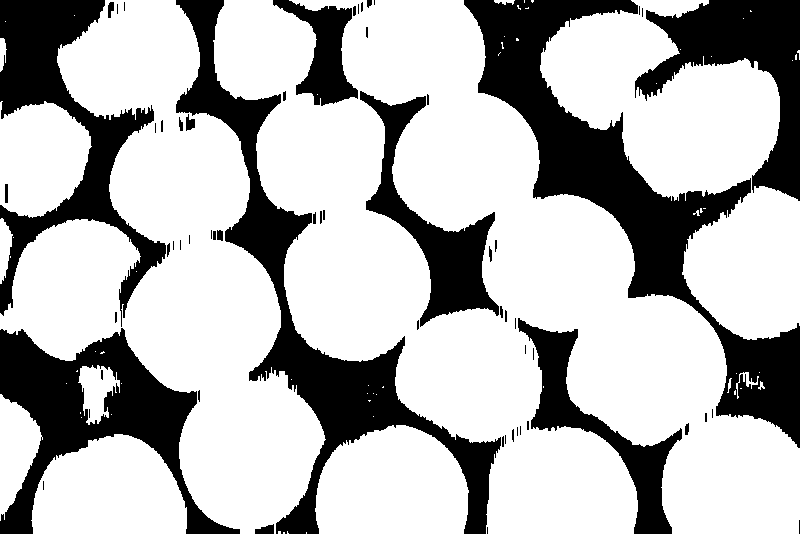

In [ ]:
closing_img_oranges = cv2.morphologyEx(thresh_img_oranges, cv2.MORPH_CLOSE, kernel, iterations = 4)

cv2_imshow(closing_img_oranges)

### Transformada de Distância (`cv2.distanceTransform`)

A transformada de distância calcula a distância de cada pixel do primeiro plano ao pixel de fundo mais próximo. Isso cria uma espécie de mapa de "montanhas" e "vales", onde o centro dos objetos terá os valores mais altos. Para este algoritmo, é aplicada à imagem inversa (`255 - closing_img_oranges`) para que os objetos se tornem o fundo e o fundo se torne os objetos, ou seja, para que as distâncias sejam calculadas a partir dos limites dos objetos para o seu interior.

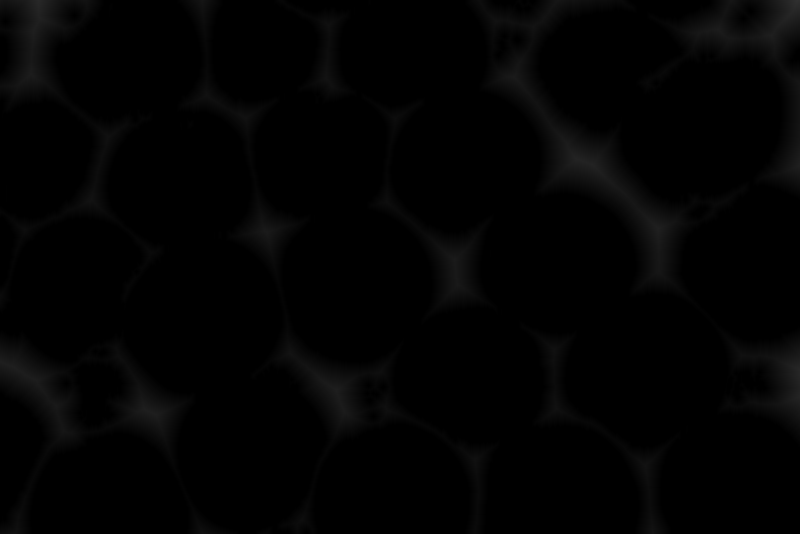

In [ ]:
dist_transform = cv2.distanceTransform(255 - closing_img_oranges, cv2.DIST_L2, 3)
cv2_imshow(dist_transform)

### Encontrando Máximos Locais (`peak_local_max`)

Com a transformada de distância, podemos encontrar os "picos" dentro de cada objeto. Estes picos correspondem aos centros mais prováveis de cada laranja. A função `peak_local_max` da biblioteca `skimage` é utilizada para identificar esses máximos locais, que servirão como "marcadores" para o algoritmo Watershed.

### Agrupando Máximos Locais com K-Means (Opcional)

Em alguns casos, a função `peak_local_max` pode retornar um número muito grande de máximos locais que estão muito próximos. Para refinar esses marcadores e garantir que cada laranja tenha um único ponto central, podemos usar um algoritmo de agrupamento como o K-Means. Aqui, os máximos locais são agrupados e os centros dos clusters são usados como os marcadores finais. Isso ajuda a evitar super-segmentação.

In [ ]:
local_max_location = peak_local_max(dist_transform, min_distance=1)

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=30)
kmeans.fit(local_max_location)
local_max_location = kmeans.cluster_centers_.copy()

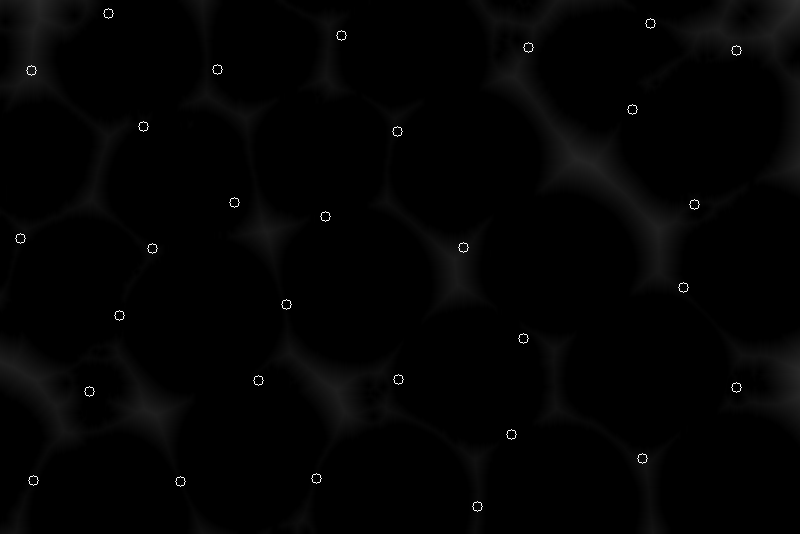

In [ ]:
local_max_location = local_max_location.astype(int)

local_max_location.shape
dist_transform_copy = dist_transform.copy()
for i in range(local_max_location.shape[0]):
  cv2.circle( dist_transform_copy, (local_max_location[i][1],local_max_location[i][0]  ), 5, 255 )

cv2_imshow(dist_transform_copy)

### Criando Marcadores para o Watershed

Com os máximos locais refinados, criamos uma imagem de 'marcadores'. Cada máximo local é um ponto de semente para o algoritmo Watershed, e recebe um rótulo numérico único. Todos os outros pixels na imagem de marcadores são zero. O algoritmo Watershed usará esses pontos para 'inundar' a imagem e segmentar os objetos. Os marcadores são visualizados aqui com seus rótulos numéricos.

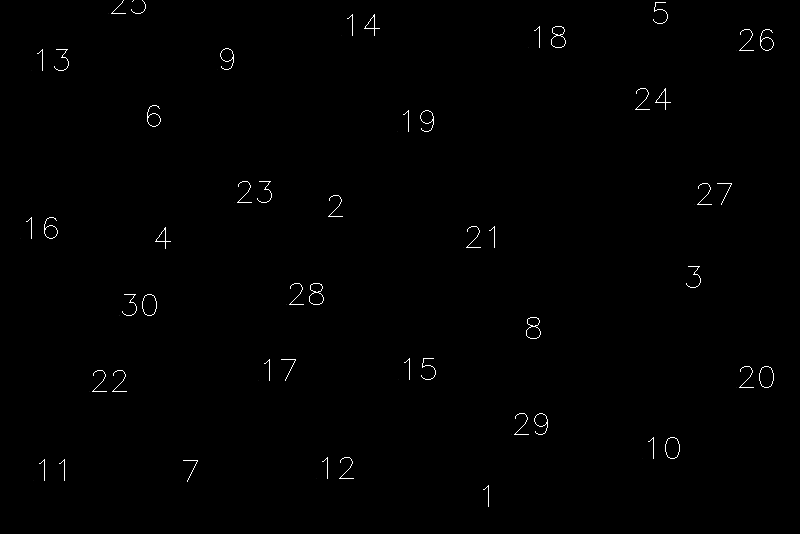

In [ ]:
markers = np.zeros_like(dist_transform)
labels = np.arange(kmeans.n_clusters)
markers[local_max_location[:,0],local_max_location[:,1]   ] = labels + 1
# Convert all local markers to an integer. This because cluster centers will be float numbers.
markers = markers.astype(int)
markers_copy = markers.copy()
index_non_zero_markers = np.argwhere(markers != 0)
markers_copy = markers_copy.astype(np.uint8)
index_non_zero_markers
font = cv2.FONT_HERSHEY_SIMPLEX
for i in range(index_non_zero_markers.shape[0]):
  string_text = str(markers[index_non_zero_markers[i][0] ,index_non_zero_markers[i][1]    ])
  cv2.putText( markers_copy, string_text, (index_non_zero_markers[i][1], index_non_zero_markers[i][0]), font, 1, 255)
cv2_imshow(markers_copy)

### Aplicando o Algoritmo Watershed

Finalmente, aplicamos o algoritmo Watershed. Ele usa a imagem original (ou uma transformada de gradiente dela) e os marcadores para segmentar os objetos. As 'barragens' do Watershed (as linhas divisórias entre os objetos) são representadas por pixels com valor -1. Cada região segmentada recebe o rótulo do marcador que a originou.

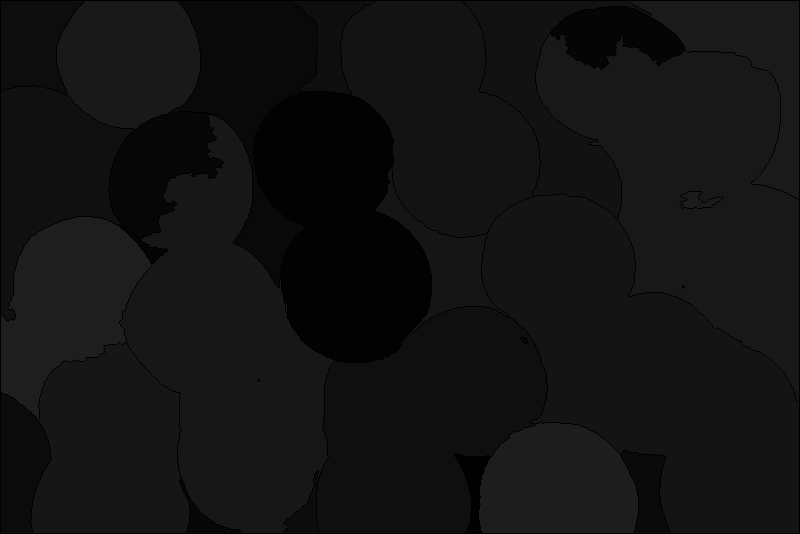

[[-1 -1 -1 ... -1 -1 -1]
 [-1 13 13 ... 26 26 -1]
 [-1 13 13 ... 26 26 -1]
 ...
 [-1 11 11 ... 20 20 -1]
 [-1 11 11 ... 20 20 -1]
 [-1 -1 -1 ... -1 -1 -1]]


In [ ]:
markers = markers.astype(np.int32)
segmented = cv2.watershed(img_oranges, markers)
cv2_imshow(segmented)
print(segmented)

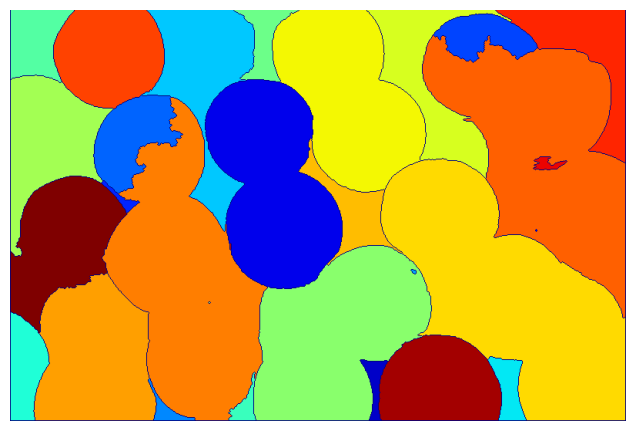

In [ ]:
dpi = plt.rcParams['figure.dpi']
figsize = img_oranges.shape[1] / float(dpi), img_oranges.shape[0] / float(dpi)

plt.figure(figsize=figsize)
plt.imshow(segmented, cmap="jet")
filename = "markers.jpg"
plt.axis('off')
plt.savefig(filename, bbox_inches = 'tight', pad_inches = 0)

### Visualização da Segmentação por Superposição

Para uma visualização mais clara da segmentação, criamos uma imagem dos contornos do Watershed e a sobrepomos à imagem original das laranjas. Isso permite ver como o algoritmo identificou e separou cada laranja individualmente.

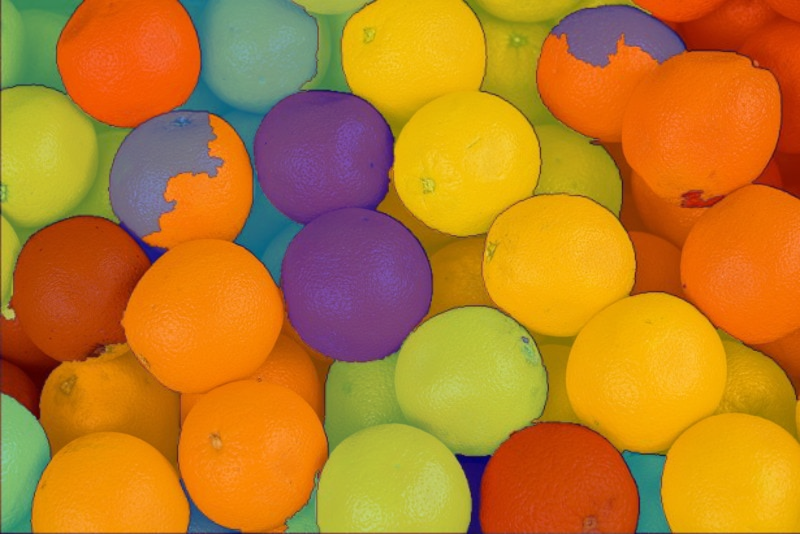

In [ ]:
from PIL import Image

overlay = cv2.imread("markers.jpg")
overlay = np.asarray(overlay)
img_copy = img_oranges.copy()
overlay_copy = overlay.copy()

overlay_copy = cv2.resize(overlay_copy, (img_copy.shape[1], img_copy.shape[0]))
final_img = cv2.addWeighted(overlay_copy, 0.5, img_copy, 0.5,	0)
cv2_imshow(final_img)

### Visualização Final dos Contornos no Original (Aprimorada)

Para uma representação ainda mais impactante, os contornos identificados pelo Watershed (onde `segmented == -1`) são desenhados diretamente sobre a imagem original das laranjas, e para melhorar a visibilidade, esses contornos são dilatados para torná-los mais espessos e proeminentes. Isso mostra claramente as fronteiras detectadas entre as laranjas.

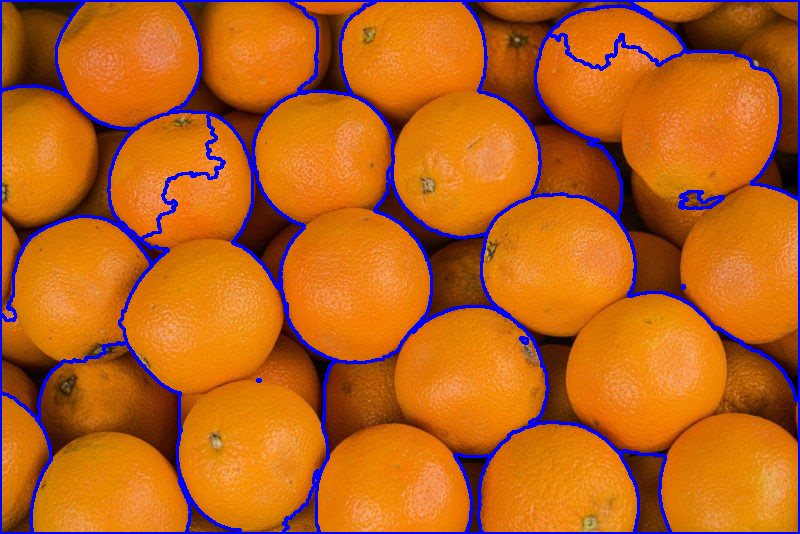

In [ ]:
img_c = img_oranges.copy()

# Create a binary mask for the watershed boundaries
contour_mask = (segmented == -1).astype(np.uint8) * 255

# Define a kernel for dilation
kernel = np.ones((3,3), np.uint8) # 3x3 kernel

# Dilate the contour mask to make lines thicker
dilated_contour_mask = cv2.dilate(contour_mask, kernel, iterations=1)

# Apply the dilated mask to the image, setting the contours to blue
img_c[dilated_contour_mask == 255] = [255, 0, 0] # Set dilated contours to blue
cv2_imshow(img_c)

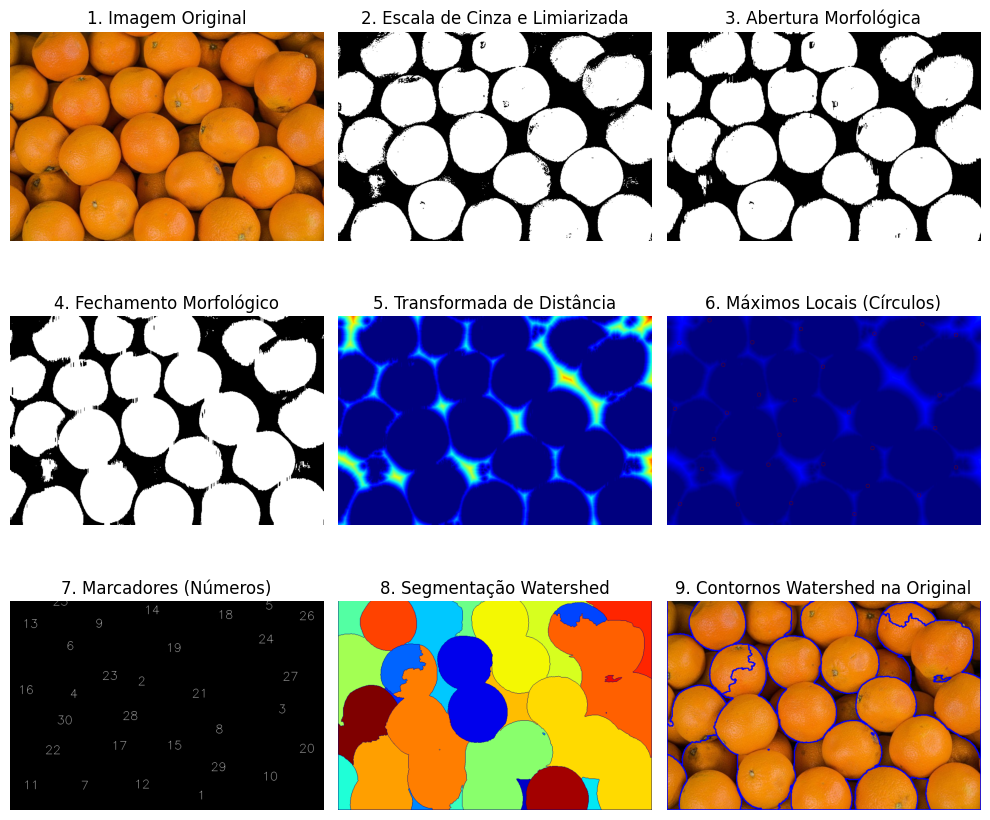

In [ ]:
fig, axs = plt.subplots(3, 3, figsize=(10, 10))

# 1. Imagem Original
axs[0, 0].imshow(cv2.cvtColor(img_oranges, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title('1. Imagem Original')
axs[0, 0].axis('off')

# 2. Escala de Cinza e Limiarização
axs[0, 1].imshow(thresh_img_oranges, cmap='gray')
axs[0, 1].set_title('2. Escala de Cinza e Limiarizada')
axs[0, 1].axis('off')

# 3. Abertura Morfológica
axs[0, 2].imshow(opening_img_oranges, cmap='gray')
axs[0, 2].set_title('3. Abertura Morfológica')
axs[0, 2].axis('off')

# 4. Fechamento Morfológico
axs[1, 0].imshow(closing_img_oranges, cmap='gray')
axs[1, 0].set_title('4. Fechamento Morfológico')
axs[1, 0].axis('off')

# 5. Transformada de Distância
axs[1, 1].imshow(dist_transform, cmap='jet')
axs[1, 1].set_title('5. Transformada de Distância')
axs[1, 1].axis('off')

# 6. Transformada de Distância com Máximos Locais (círculos)
axs[1, 2].imshow(dist_transform_copy, cmap='jet')
axs[1, 2].set_title('6. Máximos Locais (Círculos)')
axs[1, 2].axis('off')

# 7. Marcadores com Rótulos
axs[2, 0].imshow(markers_copy, cmap='gray')
axs[2, 0].set_title('7. Marcadores (Números)')
axs[2, 0].axis('off')

# 8. Segmentação Watershed
axs[2, 1].imshow(segmented, cmap='jet')
axs[2, 1].set_title('8. Segmentação Watershed')
axs[2, 1].axis('off')

# 9. Imagem Original com Contornos Watershed em Vermelho
axs[2, 2].imshow(cv2.cvtColor(img_c, cv2.COLOR_BGR2RGB))
axs[2, 2].set_title('9. Contornos Watershed na Original')
axs[2, 2].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

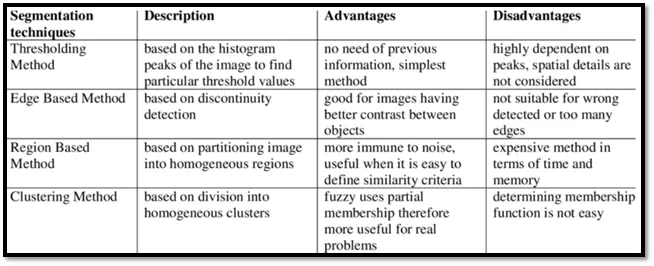

Fonte: https://pooja-bagad18.medium.com/classification-of-image-segmentation-techniques-cc6a031b75fc

### Por que a Segmentação é Importante para Machine Learning?

No contexto do Machine Learning e Deep Learning, técnicas de segmentação são cruciais para diversas aplicações:

*   **Detecção e Reconhecimento de Objetos**: Segmentar objetos permite isolá-los para que um modelo possa classificá-los com mais precisão, ou para contar instâncias de um objeto.
*   **Análise de Imagens Médicas**: Em diagnósticos, a segmentação pode separar tumores ou órgãos do tecido circundante, facilitando a medição e a análise quantitativa.
*   **Carros Autônomos**: Segmentação semântica (classificar cada pixel em categorias como 'estrada', 'pedestre', 'carro') é fundamental para a percepção do ambiente.
*   **Edição de Imagens e Visão Computacional**: Permite a aplicação seletiva de efeitos ou a manipulação de partes específicas de uma imagem.
*   **Geração de Dados Sintéticos**: Uma vez que objetos são segmentados, eles podem ser isolados e recombinados em novos cenários para aumentar a diversidade dos dados de treinamento.